# Week 4 - Optional programming exercises

- Add Gaussian and salt-and-pepper noise with different parameters to an image of your choice. Evaluate what levels of noise you consider still acceptable for visual inspection of the image.

In [7]:
%matplotlib inline

#import typical packages I'll be using
import cv2
import skimage
from skimage import data

import numpy as np
import matplotlib.pyplot as plt
import matplotlib.cm as cm
from pylab import rcParams
rcParams['figure.figsize'] = 16,8  #boiler plate to set the size of the figures
plt.gray()

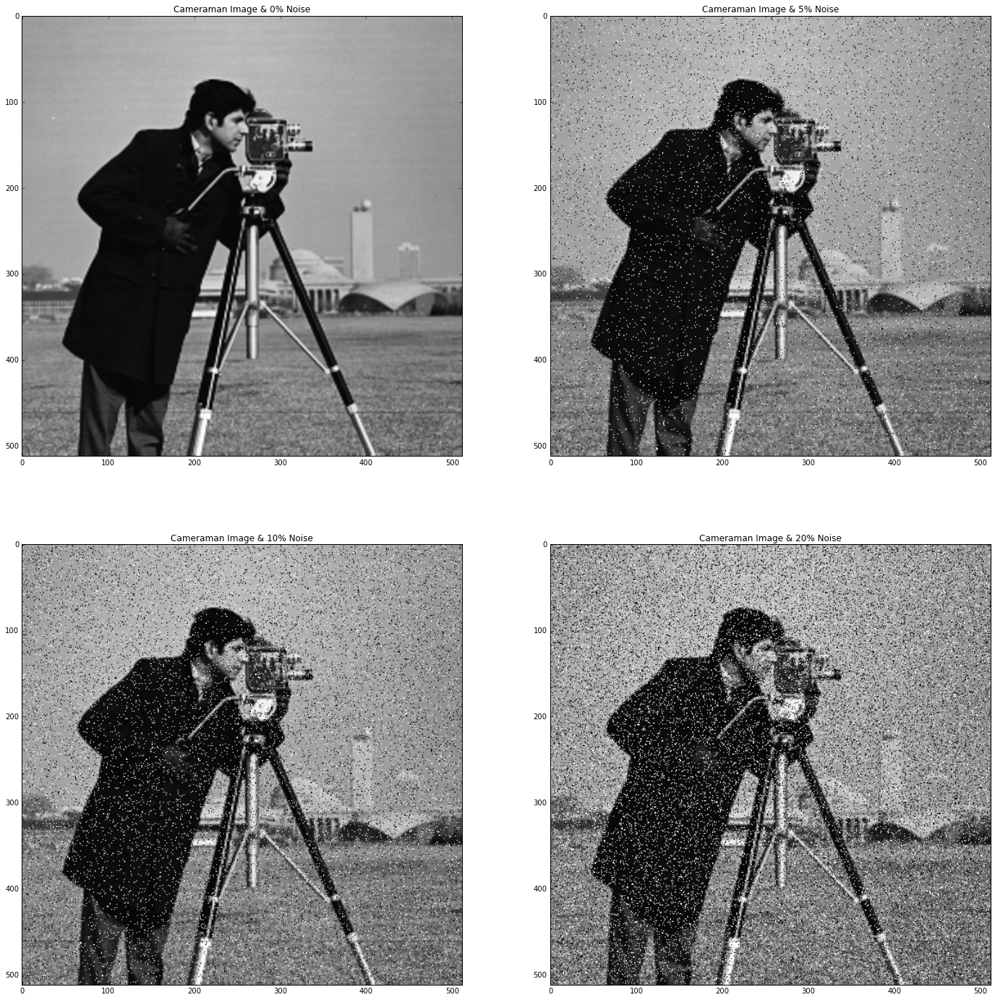

In [2]:
img = data.camera()  #the cameraman image
width,height = img.shape

f, ax = plt.subplots(2,2,figsize=(24,24))

NOISE_PERCENT = [0, 0.05,.1,.2]
for c,noise in enumerate(NOISE_PERCENT):
    img_noisy = skimage.util.random_noise(img, mode = 's&p', amount = noise)*255

    ax[c/2,c%2].set_title('Cameraman Image & {:0.0%} Noise'.format(noise))
    ax[c/2,c%2].imshow(img_noisy);

- Apply median filter to the images you obtained above. Change the window size of the filter and evaluate its relationship with the noise levels.

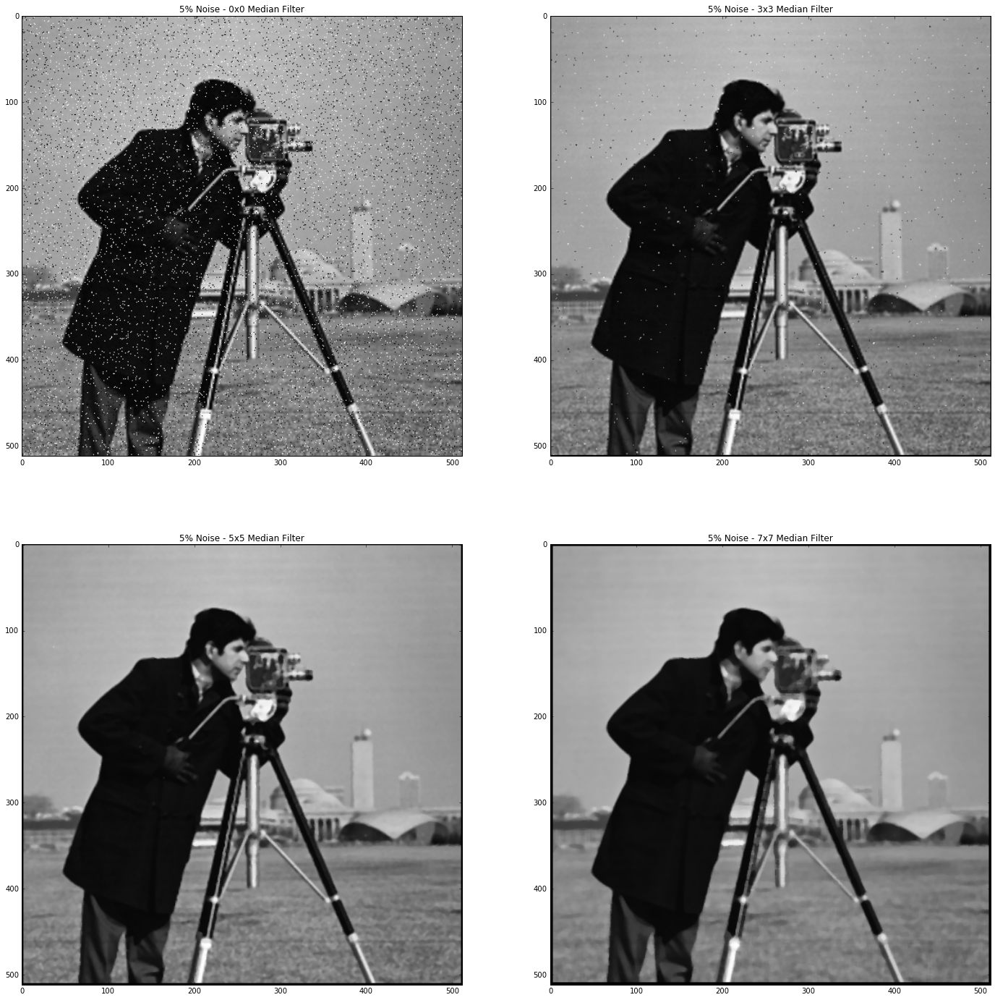

In [3]:
f, ax = plt.subplots(2,2,figsize=(24,24))

FILTER_SIZE = [0,3,5,7]

noise = 0.05
img_noisy = skimage.util.random_noise(img, mode = 's&p', amount = noise)*255

for col,filter_size in enumerate(FILTER_SIZE): 
    img_recover = np.empty_like(img)

    f = filter_size/2

    if filter_size:
        for r in range(f,height-f):
            for c in range(f,width-f):
                #print r,c
                img_recover[r,c] = np.median(img_noisy[r-f:r+f,c-f:c+f])

    else:
        img_recover = img_noisy
        
    ax[col/2,col%2].set_title('{:0.0%} Noise - {}x{} Median Filter'.format(noise,filter_size,filter_size))
    ax[col/2,col%2].imshow(img_recover);

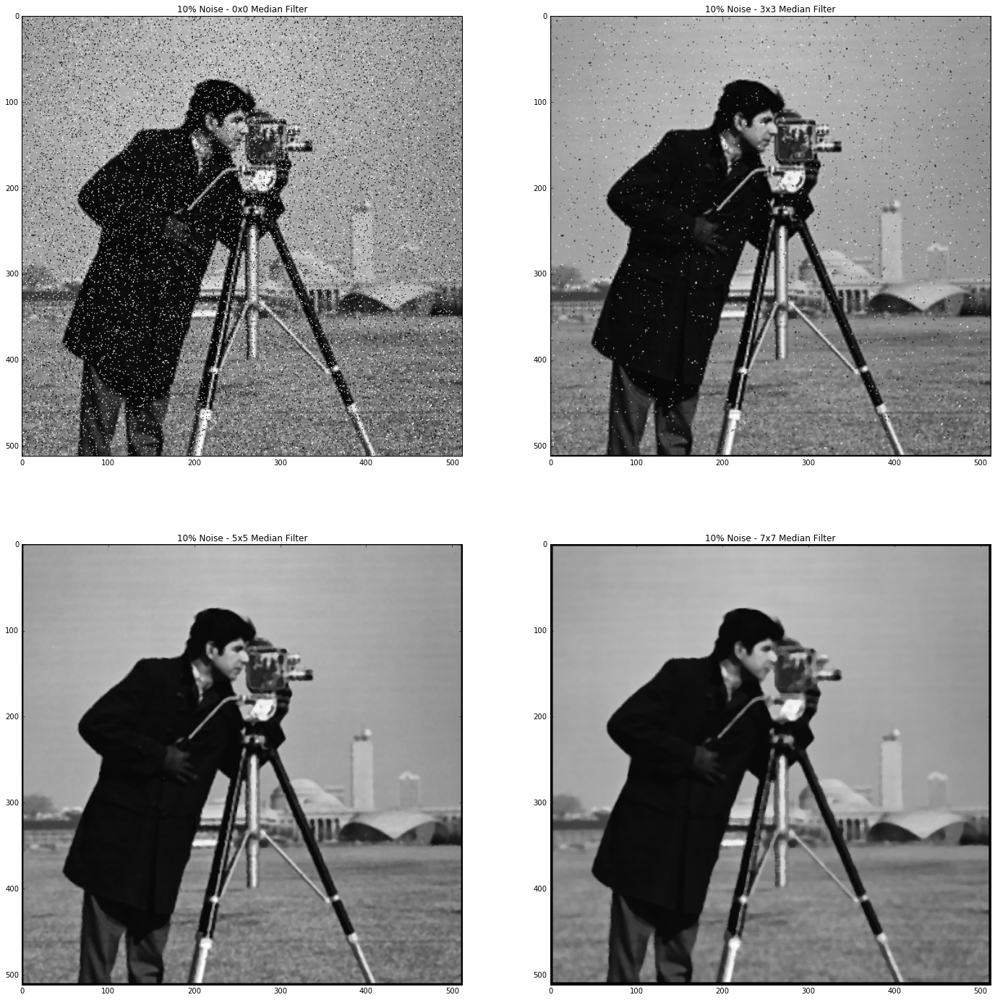

In [4]:
f, ax = plt.subplots(2,2,figsize=(24,24))

FILTER_SIZE = [0,3,5,7]

noise = 0.1
img_noisy = skimage.util.random_noise(img, mode = 's&p', amount = noise)*255

for col,filter_size in enumerate(FILTER_SIZE): 
    img_recover = np.empty_like(img)

    f = filter_size/2

    if filter_size:
        for r in range(f,height-f):
            for c in range(f,width-f):
                #print r,c
                img_recover[r,c] = np.median(img_noisy[r-f:r+f,c-f:c+f])

    else:
        img_recover = img_noisy
        
    ax[col/2,col%2].set_title('{:0.0%} Noise - {}x{} Median Filter'.format(noise,filter_size,filter_size))
    ax[col/2,col%2].imshow(img_recover);

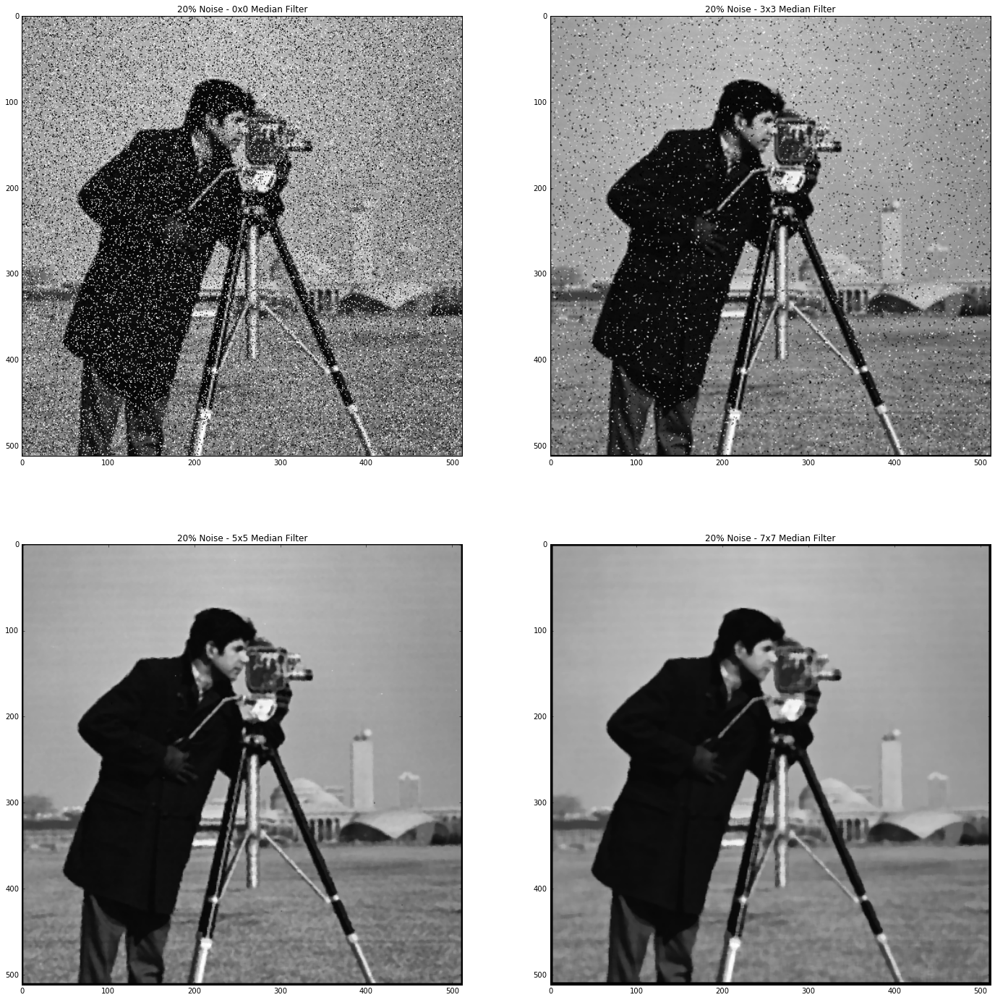

In [5]:
f, ax = plt.subplots(2,2,figsize=(24,24))

FILTER_SIZE = [0,3,5,7]

noise = 0.2
img_noisy = skimage.util.random_noise(img, mode = 's&p', amount = noise)*255

for col,filter_size in enumerate(FILTER_SIZE): 
    img_recover = np.empty_like(img)

    f = filter_size/2

    if filter_size:
        for r in range(f,height-f):
            for c in range(f,width-f):
                #print r,c
                img_recover[r,c] = np.median(img_noisy[r-f:r+f,c-f:c+f])

    else:
        img_recover = img_noisy
        
    ax[col/2,col%2].set_title('{:0.0%} Noise - {}x{} Median Filter'.format(noise,filter_size,filter_size))
    ax[col/2,col%2].imshow(img_recover);

- Practice with Wiener filtering. Consider for example a Gaussian blurring (so you know exactly the H function) and play with different values of K for different types and levels of noise.

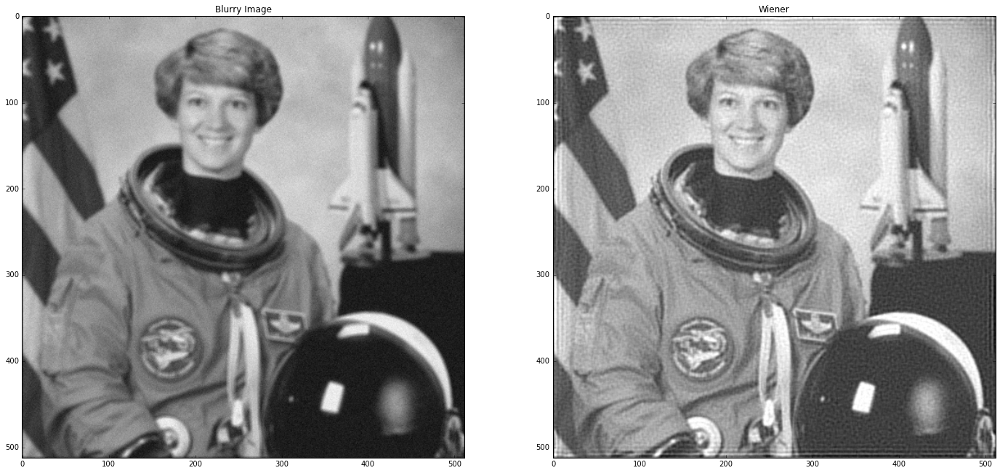

In [62]:
#Wiener example - http://scikit-image.org/docs/0.11.x/auto_examples/plot_restoration.html?highlight=wiener

from skimage import data, color, restoration
from scipy.signal import convolve2d as conv2

img = color.rgb2gray(data.astronaut())

psf = np.ones((5, 5)) / 25.
img_blur = conv2(img, psf, 'same')
img_blur += 0.1 * img_blur.std() * np.random.standard_normal(img_blur.shape)

deconvolved, _ = restoration.unsupervised_wiener(img_blur, psf)

f, ax = plt.subplots(1,2,figsize=(24,12))

ax[0].set_title('Blurry Image')
ax[0].imshow(img_blur)

ax[1].set_title('Wiener')
ax[1].imshow(deconvolved);

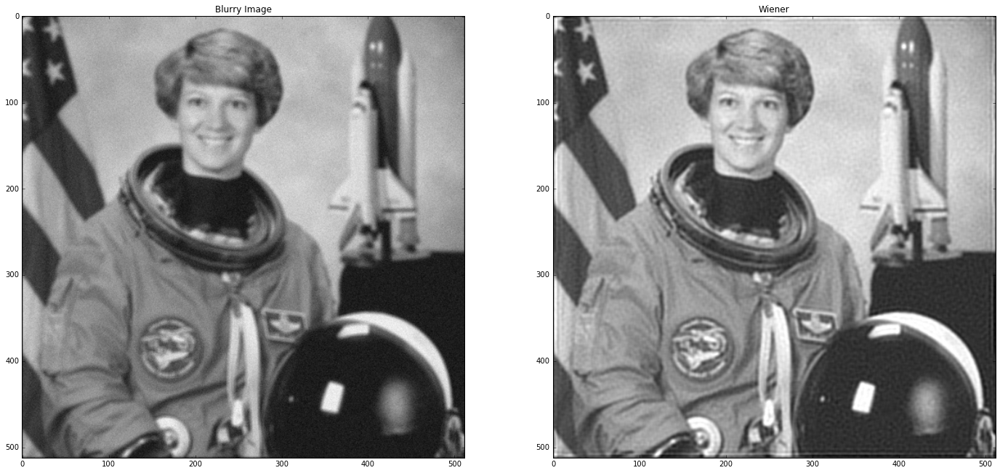

In [63]:
#Use the wiener method - choosing the parameter manually

f, ax = plt.subplots(1,2,figsize=(24,12))
deconvolved_img = restoration.wiener(img_blur, psf, .05)

ax[0].set_title('Blurry Image')
ax[0].imshow(img_blur)

ax[1].set_title('Wiener')
ax[1].imshow(deconvolved_img);

- Compare the results of non-local-means from the previous week (use for example the implementation in www.ipol.im) with those of Wiener filtering.

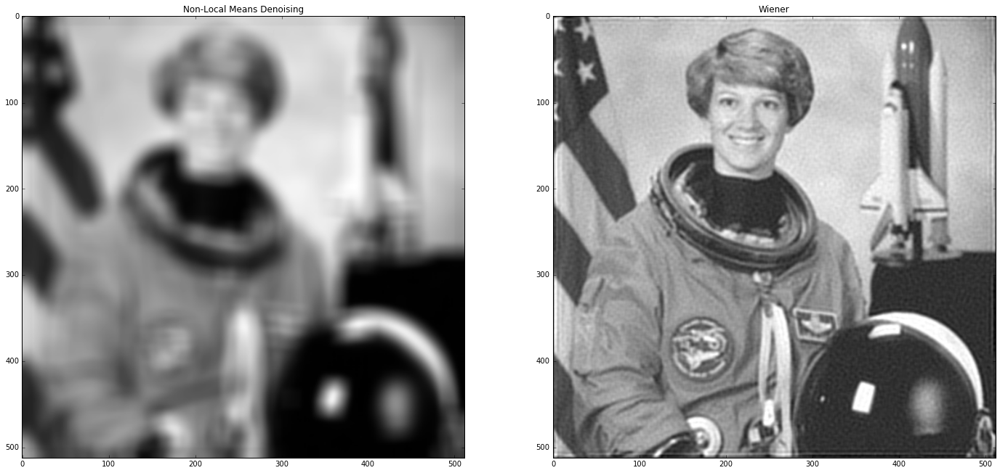

In [61]:
from skimage.restoration import nl_means_denoising

f, ax = plt.subplots(1,2,figsize=(24,12))
ax[0].set_title('Non-Local Means Denoising')
denoise = nl_means_denoising(img_blur, patch_size=5, patch_distance=11, h=25, fast_mode=True)
ax[0].imshow(denoise);

ax[1].set_title('Wiener')
ax[1].imshow(deconvolved_img);

- Blur an image applying local averaging (select different block sizes and use both overlapping and not overlapping blocks). - -
- Apply to it non-local means. 
- Observe if it helps to make the image better. 
- Could you design a restoration algorithm, for blurry images, that uses the same concepts as non-local-means?

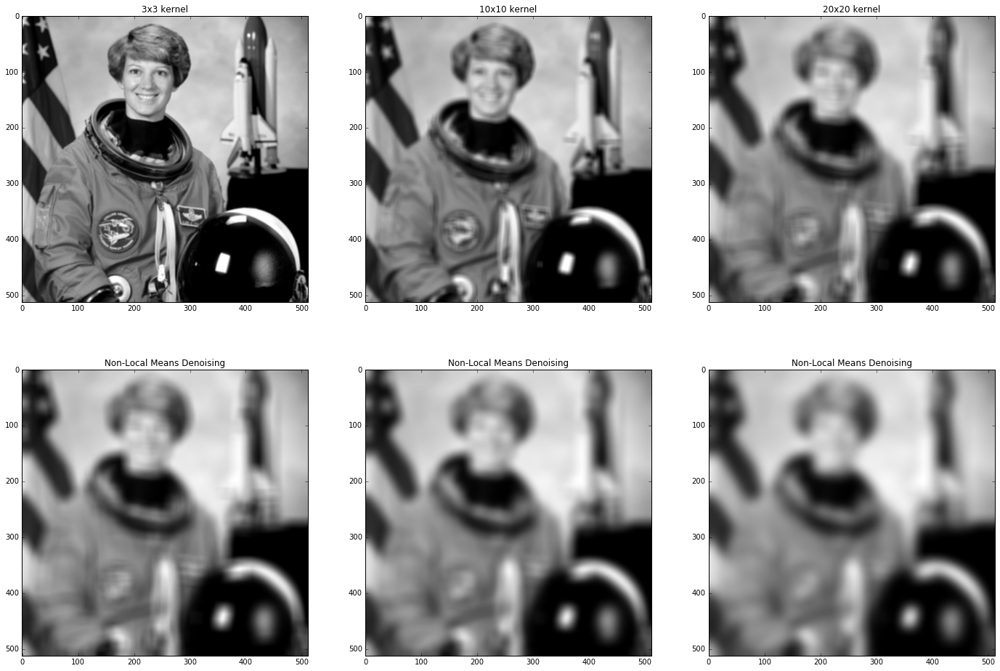

In [76]:
#Using openCV to blur the image using a normalized block filter
f, ax = plt.subplots(2,3,figsize=(24,16))

blur = cv2.blur(img,(3,3))
denoise = nl_means_denoising(blur, patch_size=5, patch_distance=11, h=25, fast_mode=True)
ax[0,0].imshow(blur)
ax[0,0].set_title('3x3 kernel')
ax[1,0].set_title('Non-Local Means Denoising')
ax[1,0].imshow(denoise);

blur = cv2.blur(img,(10,10))
denoise = nl_means_denoising(blur, patch_size=5, patch_distance=11, h=25, fast_mode=True)
ax[0,1].imshow(blur)
ax[0,1].set_title('10x10 kernel')
ax[1,1].set_title('Non-Local Means Denoising')
ax[1,1].imshow(denoise);

blur = cv2.blur(img,(20,20))
denoise = nl_means_denoising(blur, patch_size=5, patch_distance=11, h=25, fast_mode=True)
ax[0,2].imshow(blur)
ax[0,2].set_title('20x20 kernel')
ax[1,2].set_title('Non-Local Means Denoising')
ax[1,2].imshow(denoise);

- Make multiple (N) copies of the same image (e.g., N=10). 
- To each copy, apply a random rotation and add some random Gaussian noise (you can test different noise levels). 
- Using a registration function like imregister in Matlab, register the N images back (use the first image as reference, so register the other N-1 to it), and then average them. 
- Observe if you manage to estimate the correct rotation angles and if you manage to reduce the noise. 

Note: Registration means that you are aligning the images again, see for example http://www.mathworks.com/help/images/ref/imregister.html or http://en.wikipedia.org/wiki/Image_registration

In [ ]:
TBD

- Apply JPEG compression to an image, with high levels of compression such that the artifacts are noticeable. 
- Can you apply any of the techniques learned so far to enhance the image, for example, reduce the artifacts or the blocking effects? 
- Try as many techniques as you can and have time to do.

In [ ]:
TBD

- Apply any image predictor as those we learned in Week 2. Plot the histogram of the prediction error. 
- Try to fit a function to it to learn what type of distribution best first the prediction error.

In [ ]:
TBD